We start by adding the necessary folders to the current working path.

In [1]:
# import sys/os
import sys, os

# get current directory
path = os.getcwd()

# get parent directory
parent_directory = os.path.sep.join(path.split(os.path.sep))

# get laplacian of magnetic field
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
plt.style.use('classic')

import scipy.io as sio

from math import sqrt, pi
from tqdm.notebook import tqdm

# import Rectangular bivariate spline from scipy
from scipy.interpolate import RectBivariateSpline as RBS

# Import package for parallel computing
from joblib import Parallel, delayed

from scipy.optimize import least_squares, newton, root
from scipy.integrate import solve_ivp

# Import fast scientific computing library
from numba import njit, prange

# import numpy
import numpy as np

# filter
from scipy.ndimage import uniform_filter, gaussian_filter

In [2]:
# define parula map
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

cmapToUse = parula_map

# Import data

Import $ \omega_z, j_z, a_z $ at $ t = 2 $ and compute $ \Delta \boldsymbol{b}, \Delta \boldsymbol{v} $ using spectral derivatives.

In [3]:
directory_data = parent_directory+"/data/2D/"

# load data
filename = directory_data+"t2.dat"

def apply_pbc(f):
    f = np.append(f, f[0,:].reshape(1,-1), axis = 0)
    f = np.append(f, f[:,0].reshape(-1,1), axis = 1)
    return f

NX = 2048
NY = 2048
N = NX
L = 2*np.pi
sigma = 3

eta = 4*10**(-4)
nu = 4*10**(-4)

x, y = np.linspace(0, 2*np.pi, NX+1, endpoint = True), np.linspace(0, 2*np.pi, NY+1, endpoint = True)
X, Y = np.meshgrid(x, y)

dx_data = x[1]-x[0]
dy_data = y[1]-y[0]
 
def import_data(filename):
    
    dat = np.loadtxt(filename)

    print("data loaded")
    
    az_ = dat[:, 0].reshape(NX, NY)
    bx_ = dat[:, 1].reshape(NX, NY)
    by_ = dat[:, 2].reshape(NX, NY)
    jz_ = dat[:, 3].reshape(NX, NY)
    u_ = dat[:, 4].reshape(NX, NY)
    v_ = dat[:, 5].reshape(NX, NY)
    wz_ = dat[:, 6].reshape(NX, NY)
    
    jz_ = gaussian_filter(jz_, sigma = sigma, mode = "wrap")
    wz_ = gaussian_filter(wz_, sigma = sigma, mode = "wrap")
    bx_ = gaussian_filter(bx_, sigma = sigma, mode = "wrap")
    by_ = gaussian_filter(by_, sigma = sigma, mode = "wrap")
    u_ = gaussian_filter(u_, sigma = sigma, mode = "wrap")
    v_ = gaussian_filter(v_, sigma = sigma, mode = "wrap")

    # IMPORTANT: endpoint is not included as per FFT convention
    mesh_1d = np.linspace(0, L, N+1, endpoint=True) # first add end-point
    X_fft, Y_fft = np.meshgrid(mesh_1d[:-1], mesh_1d[:-1]) # get rid of end-point. This is done to make grid-spacing equal.
    mesh = np.stack((X_fft, Y_fft))

    wavenumbers_1d = np.fft.fftfreq(N, d=1/N) * 2 * np.pi / L
    KX, KY = np.meshgrid(wavenumbers_1d, wavenumbers_1d)
    wavenumbers = np.stack((KX, KY))

    # More precisely: the "gradient" operator (as it accumulates all partial derivatives)
    derivative_operator = 1j * wavenumbers
    
    dadx = np.fft.ifft2(derivative_operator[0] * np.fft.fft2(az_)).real
    dady = np.fft.ifft2(derivative_operator[1] * np.fft.fft2(az_)).real

    lap_bx_ = -eta*np.fft.ifft2(derivative_operator[1] * np.fft.fft2(jz_)).real
    lap_by_ = eta*np.fft.ifft2(derivative_operator[0] * np.fft.fft2(jz_)).real

    lap_u_ = -nu*np.fft.ifft2(derivative_operator[1] * np.fft.fft2(wz_)).real
    lap_v_ = nu*np.fft.ifft2(derivative_operator[0] * np.fft.fft2(wz_)).real
    
    dudx_ = np.fft.ifft2(derivative_operator[0] * np.fft.fft2(u_)).real
    dudy_ = np.fft.ifft2(derivative_operator[1] * np.fft.fft2(u_)).real
    
    dvdx_ = np.fft.ifft2(derivative_operator[0] * np.fft.fft2(v_)).real
    dvdy_ = np.fft.ifft2(derivative_operator[1] * np.fft.fft2(v_)).real

    lap_bx_ = apply_pbc(lap_bx_)
    lap_by_ = apply_pbc(lap_by_)
    lap_u_ = apply_pbc(lap_u_)
    lap_v_ = apply_pbc(lap_v_)
    u_ = apply_pbc(u_)
    v_ = apply_pbc(v_)
    dudx_ = apply_pbc(dudx_)
    dudy_ = apply_pbc(dudy_)
    dvdx_ = apply_pbc(dvdx_)
    dvdy_ = apply_pbc(dvdy_)
    bx_ = apply_pbc(bx_)
    by_ = apply_pbc(by_)
    jz_ = apply_pbc(jz_)
    wz_ = apply_pbc(wz_)
    az_ = apply_pbc(az_)
    
    return az_, wz_, jz_, bx_, by_, u_, v_, lap_bx_, lap_by_, lap_u_, lap_v_, dudx_, dudy_, dvdx_, dvdy_

az, wz, jz, bx, by, u, v, lap_bx, lap_by, lap_u, lap_v, dudx, dudy, dvdx, dvdy = import_data(filename)


data loaded


# Setup

Specifiy domain over which we compute the Eulerian barriers.

In [4]:
# Number of cores for parallel computing
Ncores = 16 # int >= 1

## resolution of meshgrid
dx_data = X[0,1]-X[0,0]
dy_data = Y[1,0]-Y[0,0]
delta = [dx_data, dy_data]

# domain boundary
xmin = 0 #1 # between 0 and 2pi
xmax = 2*pi #2.5 # between 0 and 2pi
ymin = 0 #3 # between 0 and 2pi
ymax = 2*pi #4.5 # between 0 and 2pi

# Number of grid cells used in domain
Nx = 600 # 300
Ny = 600 # 300

# ticks for plotting
xticks = [0, pi/2, pi, 3/2*pi, 2*pi] #[1.0, 1.5, 2.0, 2.5]
yticks = [0, pi/2, pi, 3/2*pi, 2*pi] #[3.0, 3.5, 4.0, 4.5]

# ticklabels for plotting
xticklabels = [r'$0$', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'$2\pi$'] #[r'$1.0$', r'$1.5$', r'$2.0$', r'$2.5$'] 
yticklabels = [r'$0$', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$', r'$2\pi$'] #[r'$3.0$', r'$3.5$', r'$4.0$', r'$4.5$']

# specify domain over which to compute active magnetic barriers
x_domain = np.linspace(xmin, xmax, Nx, endpoint = True)
y_domain = np.linspace(ymin, ymax, Ny, endpoint = True)

# grid-spacing
dx = x_domain[1]-x_domain[0]
dy = y_domain[1]-y_domain[0]

#compute meshgrid
X_domain, Y_domain = np.meshgrid(x_domain, y_domain)

# Define ratio of auxiliary grid spacing vs original grid_spacing
aux_grid_ratio = .1
aux_grid = [aux_grid_ratio*dx, aux_grid_ratio*dy]

# Auxiliary functions
Here we define some auxiliar functions that we use for the computations. 

In [5]:
# Split x0, y0 into N (equal) batches for parallel computing
def split(a, n):
    k, m = divmod(len(a), n)
    return (a[i*k+min(i, m):(i+1)*k+min(i+1, m)] for i in range(n))

@njit()
def _find_all_local_maxima(X, Y, H, loc_threshold = 0, min_dist = 1*10**(-1)):
    '''
    Find all local maxima in a scalar field.

    Parameters:
        X: array (Nx, Ny), X-meshgrid
        Y: array (Nx, Ny), Y-meshgrid
        H: array(Nx, Ny), Scalar field to analyze
        
    Returns:
        idx_x: X position in the grid of the maxima 
        idx_y: Y position in the grid of the maxima
        loc_max_x: X position of the maxima (loc_max_x = X[idx_x, idx_y])
        loc_max_y: Y position of the maxima (loc_max_y = Y[idx_x, idx_y])
        loc_max_field: value of the maxima
    '''
    
    loc_max_x, loc_max_y, loc_max_field = [], [], []
    idx_x, idx_y = [], []
            
    for i in range(2, X.shape[0]-2):
                
        for j in range(2, Y.shape[1]-2):
                    
            if np.isfinite(H[i, j]) and H[i, j] > H[i+1, j] and H[i, j] > H[i-1, j] and H[i, j] > H[i, j+1] and H[i, j] > H[i, j-1] and H[i,j] > loc_threshold:
                
                bool_add = True
                
                for k in range(len(loc_max_x)):
                    if sqrt((X[i, j]-loc_max_x[k])**2+(Y[i, j]-loc_max_y[k])**2) < min_dist:
                        bool_add = False
                
                if bool_add:
                
                    loc_max_x.append(X[i, j])
                    loc_max_y.append(Y[i, j])
                    loc_max_field.append(H[i, j])
                    idx_x.append(j)
                    idx_y.append(i)
    
    return idx_x, idx_y, loc_max_x, loc_max_y, loc_max_field

def velocity(x, Interpolant_x, Interpolant_y):
    
    vx = Interpolant_x(x[1]%(2*np.pi), x[0]%(2*np.pi))[0][0]
    vy = Interpolant_y(x[1]%(2*np.pi), x[0]%(2*np.pi))[0][0]
    
    return [vx, vy]

def velocity_odeint(t, x, Interpolant_x, Interpolant_y):
    
    vx = Interpolant_x(x[1]%(2*np.pi), x[0]%(2*np.pi))[0][0]
    vy = Interpolant_y(x[1]%(2*np.pi), x[0]%(2*np.pi))[0][0]
    
    v_norm = sqrt(vx**2+vy**2)
    
    return [vx/v_norm, vy/v_norm]

def sort_algorithm(arg_sort, list_):

    sorted_list = []
    
    for a in arg_sort:
        sorted_list.append(list_[a])

    return sorted_list

def get_ABS(x, Interpolant_x, Interpolant_y):
    
    v = velocity(x, Interpolant_x, Interpolant_y)
    
    return np.sqrt(v[0]**2+v[1]**2)
    
def grad_ABS(x, Interpolant_x, Interpolant_y):
    
    xr = x+10**(-6)*np.array([1,0])
    xl = x-10**(-6)*np.array([1,0])
    
    xu = x+10**(-6)*np.array([0,1])
    xd = x-10**(-6)*np.array([0,1])
    
    ABSr = get_ABS(xr, Interpolant_x, Interpolant_y)
    ABSl = get_ABS(xl, Interpolant_x, Interpolant_y)
    ABSu = get_ABS(xu, Interpolant_x, Interpolant_y)
    ABSd = get_ABS(xd, Interpolant_x, Interpolant_y)
    
    dABSdx = (ABSr-ABSl)/(xr[0]-xl[0])
    dABSdy = (ABSu-ABSd)/(xu[1]-xd[1])
    
    return [dABSdx, dABSdy]
      
def get_all_barriers(X, Y, ABS, ABS_threshold, Interpolant_x, Interpolant_y, NT, epsilon_ABS, Lmin, Tmax, min_dist):
    
    def get_barrier_ABS(ic, Lmin, Tmax, Interpolant_x, Interpolant_y, epsilon_ABS, NT = 500):
    
        class Solution:
            def __init__(self, y):
                self.y = y
    
                ABS_init = get_ABS(ic, Interpolant_x, Interpolant_y)
    
        def stopping_criterion(t, x, Interpolant_x, Interpolant_y):
        
            ABS = get_ABS(x, Interpolant_x, Interpolant_y)
        
            return epsilon_ABS-ABS
    
        def get_length(x, Lmin):
            
            # initial point
            x_init = x[0,0]
            y_init = x[1,0]
        
            # initial length of material barrier
            L = 0
                    
            # stop integration if two successive points are too close to each other.
            epsilon = 1*10**(-2)
            
            # initialization of index
            index = -1
        
            for i in range(x.shape[1]-1):
                L += sqrt((x[0,i+1]-x[0,i])**2+(x[1,i+1]-x[1,i])**2)
                if (L > 0.2) and (sqrt((x[0,i+1]-x_init)**2+(x[1,i+1]-y_init)**2) < epsilon):
                    index = i
                    break
                   
            return L, index
        
        # list that store the forward and backward barriers
        advected = []
    
        # stopping criterion
        stopping_criterion.terminal = True
        stopping_criterion.direction = 1
        
        # compute barriers in one barrier time direction (forward)
        sol = solve_ivp(velocity_odeint, [0, Tmax], ic, t_eval = np.linspace(0, Tmax, NT),
                    rtol=1e-8, atol = 1e-8, method = 'RK45', events = stopping_criterion, args = [Interpolant_x, Interpolant_y])
        
        # get length of barriers
        L_forw, final_index = get_length(sol.y, Lmin)
    
        sol_forw = Solution(sol.y)
        sol_forw.y = sol.y[:,:final_index]
        
        # compute barriers in other barrier time direction (backward)
        sol = solve_ivp(velocity_odeint, [0, -Tmax], ic, t_eval = np.linspace(0, -Tmax, NT),
                    rtol=1e-8, atol = 1e-8, method = 'RK45', events = stopping_criterion, args = [Interpolant_x, Interpolant_y])
        
        # get length of barriers
        sol_back = Solution(sol.y)
        L_back, final_index = get_length(sol.y, Lmin)
    
        L = L_forw + L_back
    
        sol_back.y = sol.y[:,:final_index]
    
        sol.y = np.append(np.flip(sol_back.y, axis = 1), sol_forw.y, axis = 1)
    
        # only append barrier if length is greater then Lmin
        if L > Lmin:
            advected.append(sol)
        
        return advected
    
    # find local maxima (and its indices) of ABS field
    idx_x_ABS, idx_y_ABS, loc_max_x_ABS, loc_max_y_ABS, loc_max_ABS = _find_all_local_maxima(X, Y, ABS, ABS_threshold)
    
    # sort local maxima in descending order
    arg_sort = np.flip(np.argsort(loc_max_ABS))
    loc_max_x_ABS = sort_algorithm(arg_sort, loc_max_x_ABS)
    loc_max_y_ABS = sort_algorithm(arg_sort, loc_max_y_ABS)
    loc_max_ABS = sort_algorithm(arg_sort, loc_max_ABS)
    
    # list of barriers and local extrema
    barriers, list_extrema = [], []
    x_barriers, y_barriers = [], []
    
    # iterate over all local maxima
    for i in tqdm(range(len(loc_max_x_ABS))):
        
        # initial condition for barrier computation
        ic = np.array([loc_max_x_ABS[i], loc_max_y_ABS[i]]).reshape(2,)
        
        # here we compute the candidate barrier
        candidate_barrier = get_barrier_ABS(ic, Lmin, Tmax, Interpolant_x, Interpolant_y, epsilon_ABS, NT)
        
        # boolean variable that controls whether we retain the barrier or not
        bool_add = True
                
        for b in candidate_barrier:
            for j in range(len(list_extrema)):
                distance = sqrt(np.min((b.y[0,:]-list_extrema[j][0])**2+(b.y[1,:]-list_extrema[j][1])**2))
                if distance < min_dist:
                    bool_add = False
                    break
                    
        if bool_add and len(candidate_barrier) > 0:
            barriers.append(candidate_barrier)
            list_extrema.append(ic)
                    
    return barriers, list_extrema

# Interpolate vector fields

Interpolate all vector/scalar field over the specified domain.

In [6]:
# Interpolation
def interpolant_steady(X, Y, U, V):
    '''
    Steady wrapper for scipy.interpolate.RectBivariateSpline. Creates a list of interpolators for u and v velocities
    
    Parameters:
        X: array (Ny, Nx), X-meshgrid
        Y: array (Ny, Nx), Y-meshgrid
        U: array (Ny, Nx), U velocity
        V: array (Ny, Nx), V velocity
        
    Returns:
        Interpolant: list (2,), U and V  interpolators
    '''
    
    # define u, v interpolants
    Interpolant = []
                
    Interpolant.append(RBS(Y[:,0], X[0,:], U, kx=3, ky=3))
    Interpolant.append(RBS(Y[:,0], X[0,:], V, kx=3, ky=3))  
        
    return Interpolant

# Interpolate velocity using cubic spatial interpolation
Interpolant = interpolant_steady(X, Y, u, v)

Interpolant_u = Interpolant[0]
Interpolant_v = Interpolant[1]

# Interpolate magnetic field using cubic spatial interpolation
Interpolant = interpolant_steady(X, Y, bx, by)

Interpolant_bx = Interpolant[0]
Interpolant_by = Interpolant[1]

# Interpolate laplace(B) using cubic spatial interpolation
Interpolant = interpolant_steady(X, Y, lap_bx, lap_by)

Interpolant_lap_bx = Interpolant[0]
Interpolant_lap_by = Interpolant[1]

# Interpolate laplace(v) using cubic spatial interpolation
Interpolant = interpolant_steady(X, Y, lap_u, lap_v)

Interpolant_lap_u = Interpolant[0]
Interpolant_lap_v = Interpolant[1]

# Interpolate derivative of velocity data using cubic spatial interpolation
Interpolant = interpolant_steady(X, Y, dudx, dudy)

Interpolant_dudx = Interpolant[0]
Interpolant_dudy = Interpolant[1]

Interpolant = interpolant_steady(X, Y, dvdx, dvdy)

Interpolant_dvdx = Interpolant[0]
Interpolant_dvdy = Interpolant[1]

# Interpolate electric current density field using cubic spatial interpolation
Interpolant = interpolant_steady(X, Y, jz, jz)

Interpolant_jz = Interpolant[0]

# Interpolate vorticity field using cubic spatial interpolation
Interpolant = interpolant_steady(X, Y, wz, wz)

Interpolant_wz = Interpolant[0]

# Interpolate magnetic scalar potential using cubic spatial interpolation
Interpolant = interpolant_steady(X, Y, az, az)

Interpolant_az = Interpolant[0]

def eval_scalar(r, Interpolant):
    return np.array(Interpolant(r[1,:]%(2*np.pi), r[0,:]%(2*np.pi), grid = False))

def eval_barrier_field(r, Interpolant_x, Interpolant_y):
    vx = Interpolant_x(r[1,:]%(2*np.pi), r[0,:]%(2*np.pi), grid = False)
    vy = Interpolant_y(r[1,:]%(2*np.pi), r[0,:]%(2*np.pi), grid = False)
    return np.array([vx, vy])
            
r = np.array([X_domain.ravel(), Y_domain.ravel()])
    
jz_domain = eval_scalar(r, Interpolant_jz).reshape(Ny, Nx)
omega_domain = eval_scalar(r, Interpolant_wz).reshape(Ny, Nx)
az_domain = eval_scalar(r, Interpolant_az).reshape(Ny, Nx)
IVD_domain = np.abs(omega_domain-np.mean(omega_domain.ravel()))
    
lap_b_domain = eval_barrier_field(r, Interpolant_lap_bx, Interpolant_lap_by).reshape(2, Ny, Nx)
lap_vel_domain = eval_barrier_field(r, Interpolant_lap_u, Interpolant_lap_v).reshape(2, Ny, Nx)
b_domain = eval_barrier_field(r, Interpolant_bx, Interpolant_by).reshape(2, Ny, Nx)


# Get active barriers

In this section we compute the magnetic and the momentum barriers. We do so by following the algorithm highlighted in the paper.

## Get magnetic barriers

In [7]:
lambda_T_mag = 1*24*10**(-2)
lambda_K_mag = 10*10**(-3)

Tmax = 1*10**(3)
Lmin_mag = lambda_T_mag
min_dist_mag = lambda_K_mag
NT = 2*10**5

lap_b_domain_norm = np.linalg.norm(lap_b_domain, axis = 0, ord = 2)
lap_b_threshold = np.mean(lap_b_domain_norm)
epsilon_ABS = lap_b_threshold

barriers_magnetic, extrema_magnetic = get_all_barriers(X_domain, Y_domain, lap_b_domain_norm, lap_b_threshold, Interpolant_lap_bx, Interpolant_lap_by, NT, epsilon_ABS, Lmin_mag, Tmax, min_dist_mag)

  0%|          | 0/1559 [00:00<?, ?it/s]

## Get active momentum barriers

In [8]:
lambda_T_kin = 1*24*10**(-2)
lambda_K_kin = 10.5*10**(-3)

Lmin_kin = lambda_T_kin
min_dist_kin = lambda_K_kin
lap_vel_domain_norm = np.linalg.norm(lap_vel_domain, axis = 0, ord = 2)
lap_vel_threshold = np.mean(lap_vel_domain_norm)
epsilon_ABS = lap_vel_threshold

barriers_momentum, extrema_momentum = get_all_barriers(X_domain, Y_domain, lap_vel_domain_norm, lap_vel_threshold, Interpolant_lap_u, Interpolant_lap_v, NT, epsilon_ABS, Lmin_kin, Tmax, min_dist_kin)

  0%|          | 0/1617 [00:00<?, ?it/s]

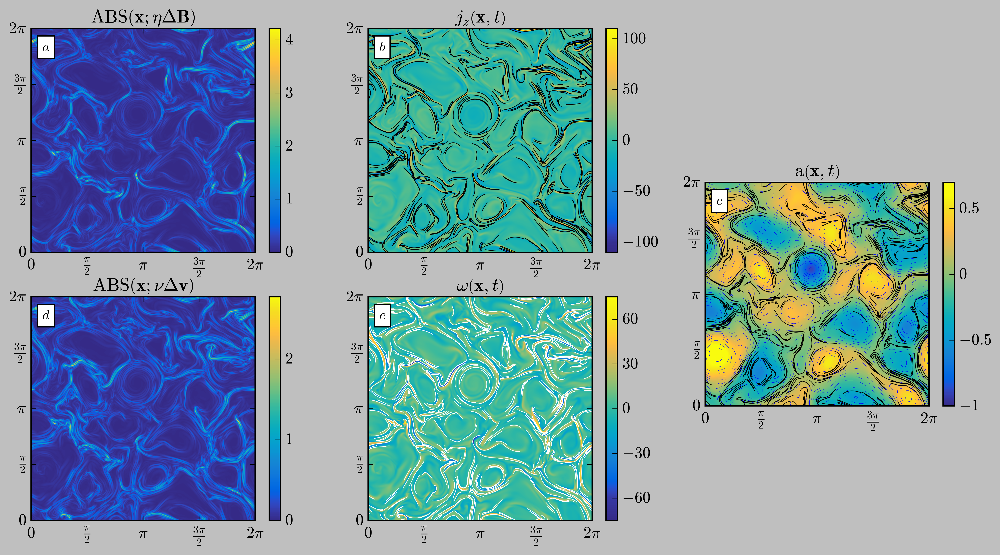

In [9]:
# PLOTTING
import matplotlib.colors as colors

%matplotlib inline

fontsize = 15
cmapToUse = parula_map

fig, ax = plt.subplots(2, 3, figsize = (14, 7), dpi = 500);

ax[0,0].set_title(r'$ \mathrm{{ABS}} \left(\mathbf{{x}}; \eta \Delta \mathbf{{B}} \right) $', fontsize = fontsize)
ax[1,0].set_title(r'$ \mathrm{{ABS}} \left(\mathbf{{x}}; \nu \Delta \mathbf{{v}} \right) $', fontsize = fontsize)
ax[0,1].set_title(r'$ j_z \left( \mathbf{{x}}, t \right) $', fontsize = fontsize)
ax[1,1].set_title(r'$ \omega \left(\mathbf{{x}}, t \right) $', fontsize = fontsize)
ax[0,2].set_title(r'$ \mathrm{a} \left(\mathbf{{x}}, t \right) $', fontsize = fontsize)

cax00 = ax[0,0].contourf(X_domain, Y_domain, lap_b_domain_norm, cmap = cmapToUse, levels = 300)

cax10 = ax[1,0].contourf(X_domain, Y_domain, lap_vel_domain_norm, cmap = cmapToUse, levels = 300)

cax01 = ax[0,1].contourf(X_domain, Y_domain, jz_domain, cmap = cmapToUse, levels = np.linspace(-110, 110, 300), 
                 norm=colors.SymLogNorm(linthresh=100, linscale=1, base=10), vmin = -110, vmax = 110)

cax11 = ax[1,1].contourf(X_domain, Y_domain, omega_domain, cmap = cmapToUse, levels = np.linspace(-75, 75, 300),
                        norm=colors.SymLogNorm(linthresh=60, linscale=1, base=10), vmin = -75, vmax = 75)

cax02 = ax[0,2].contourf(X_domain, Y_domain, az_domain, cmap = cmapToUse, 
                         levels = np.linspace(-1, 0.7, 300), vmin = -1, vmax = 0.6)

ax[0,2].contour(X_domain, Y_domain, az_domain, colors = "b", linewidths = 0.2, 
                linestyles = "dashed", levels = 20)

cbar00 = plt.colorbar(cax00, ax = ax[0,0], ticks = [0, 1, 2, 3, 4])
cbar01 = plt.colorbar(cax01, ax = ax[0,1], ticks = [-100, -50, 0, 50, 100])
cbar10 = plt.colorbar(cax10, ax = ax[1,0], ticks = [0, 1, 2, 3, 4])
cbar11 = plt.colorbar(cax11, ax = ax[1,1], ticks = [-60, -30, 0, 30, 60])
cbar02 = plt.colorbar(cax02, ax = ax[0,2], ticks = [-1, -0.5, 0, 0.5, 1])

cbar00.ax.set_yticklabels([r'$0$', r'$1$', r'$2$', r'$3$', r'$4$'], fontsize = fontsize-2)
cbar01.ax.set_yticklabels([r'$-100$', r'$-50$', r'$0$', r'$50$', r'$100$'], fontsize = fontsize-2)
cbar02.ax.set_yticklabels([r'$-1$', r'$-0.5$', r'$0$', r'$0.5$', r'$1$'], fontsize = fontsize-2)
cbar10.ax.set_yticklabels([r'$0$', r'$1$', r'$2$', r'$3$', r'$4$'], fontsize = fontsize-2)
cbar11.ax.set_yticklabels([r'$-60$', r'$-30$', r'$0$', r'$30$', r'$60$'], fontsize = fontsize-2)

for barrier in barriers_magnetic:
    for b in barrier:
        #ax[0,0].plot(b.y[0,:], b.y[1,:], c = "k", linewidth = 0.4)#, linestyle = "dashed")
        ax[0,1].plot(b.y[0,:], b.y[1,:], c = "k", linewidth = 0.5)#, linestyle = "dashed")
        ax[0,2].plot(b.y[0,:], b.y[1,:], c = "k", linewidth = 0.5)#, linestyle = "dashed")

for barrier in barriers_momentum:
    for b in barrier:
        #ax[1,0].plot(b.y[0,:], b.y[1,:], c = "w", linewidth = 0.4)
        ax[1,1].plot(b.y[0,:], b.y[1,:], c = "w", linewidth = 0.5)
        
ax[0,0].text(.05, .9, r'$a$', fontsize = fontsize-4, transform=ax[0,0].transAxes, bbox = dict(facecolor='w', edgecolor='k'))
ax[0,1].text(.05, .9, r'$b$', fontsize = fontsize-4, transform=ax[0,1].transAxes, bbox = dict(facecolor='w', edgecolor='k'))
ax[0,2].text(.05, .9, r'$c$', fontsize = fontsize-4, transform=ax[0,2].transAxes, bbox = dict(facecolor='w', edgecolor='k'))
ax[1,0].text(.05, .9, r'$d$', fontsize = fontsize-4, transform=ax[1,0].transAxes, bbox = dict(facecolor='w', edgecolor='k'))
ax[1,1].text(.05, .9, r'$e$', fontsize = fontsize-4, transform=ax[1,1].transAxes, bbox = dict(facecolor='w', edgecolor='k'))

for a in ax.ravel():
    
    a.set_aspect("equal")

    a.set_xticks(xticks)
    a.set_yticks(yticks)

    a.set_xticklabels(xticklabels, fontsize = fontsize - 2)
    a.set_yticklabels(yticklabels, fontsize = fontsize - 2)

    a.set_xlim([xmin, xmax])
    a.set_ylim([ymin, ymax])

ax[1,2].set_visible(False)

box = ax[0,2].get_position()
box.y0 = box.y0 - 0.25
box.y1 = box.y1 - 0.25
ax[0,2].set_position(box)

box = cbar02.ax.get_position()
box.y0 = box.y0 - 0.25
box.y1 = box.y1 - 0.25
cbar02.ax.set_position(box)

plt.savefig(r'Fig2_revision.jpg', bbox_inches = "tight", dpi = 500)
plt.show()


  0%|          | 0/512 [00:00<?, ?it/s]

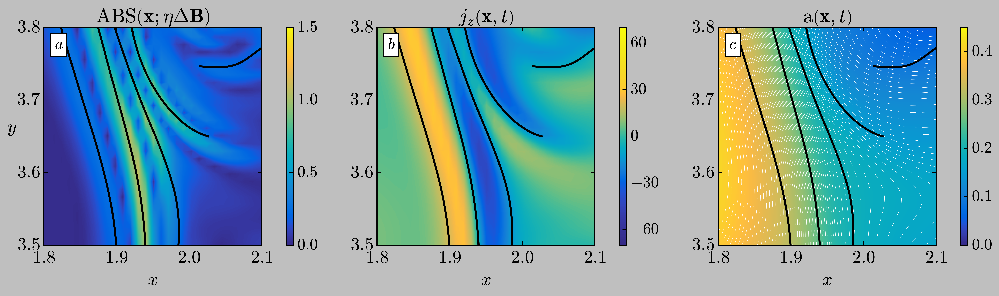

In [10]:
# PLOTTING
import matplotlib.colors as colors

xmin_zoom, xmax_zoom = 1.8, 2.1
ymin_zoom, ymax_zoom = 3.5, 3.8

xticks_zoom = np.arange(xmin_zoom, xmax_zoom+0.01, 0.1)
yticks_zoom = np.arange(ymin_zoom, ymax_zoom+0.01, 0.1)

xticklabels_zoom = [r'$1.8$', r'$1.9$', r'$2.0$', r'$2.1$']
yticklabels_zoom = [r'$3.5$', r'$3.6$', r'$3.7$', r'$3.8$']

fontsize = 20
cmapToUse = parula_map

fig, ax = plt.subplots(1, 3, figsize = (14, 4), dpi = 500, constrained_layout = True);

ax[0].set_title(r'$ \mathrm{{ABS}} \left(\mathbf{{x}}; \eta \Delta \mathbf{{B}} \right) $', fontsize = fontsize)
ax[1].set_title(r'$ j_z \left( \mathbf{{x}}, t \right) $', fontsize = fontsize)
ax[2].set_title(r'$ \mathrm{a} \left(\mathbf{{x}}, t \right) $', fontsize = fontsize)

cax0 = ax[0].contourf(X_domain, Y_domain, lap_b_domain_norm, cmap = cmapToUse,
                        levels = np.linspace(0, 1.5, 300), vmin = 0, vmax = 1.5)

cax1 = ax[1].contourf(X_domain, Y_domain, jz_domain, cmap = cmapToUse, levels = np.linspace(-70, 70, 300), 
                 norm=colors.SymLogNorm(linthresh=30, linscale=1, base=10), vmin = -70, vmax = 70)

cax2 = ax[2].contourf(X_domain, Y_domain, az_domain, cmap = cmapToUse, 
                         levels = np.linspace(0, 0.45, 300), vmin = 0, vmax = 0.45)

ax[2].contour(X_domain, Y_domain, az_domain, colors = "w", linewidths = 0.3, 
                linestyles = "dashed", levels = np.linspace(0, 0.4, 100))

cbar0 = plt.colorbar(cax0, ax = ax[0], ticks = [0, 0.5, 1, 1.5], aspect = 30)
cbar1 = plt.colorbar(cax1, ax = ax[1], ticks = [-60, -30, 0, 30, 60], aspect = 30)
cbar2 = plt.colorbar(cax2, ax = ax[2], ticks = [0, 0.1, 0.2, 0.3, 0.4], aspect = 30)

cbar0.ax.set_yticklabels([r'$0.0$', r'$0.5$', r'$1.0$',  r'$1.5$'], fontsize = fontsize-4)
cbar1.ax.set_yticklabels([r'$-60$', r'$-30$', r'$0$', r'$30$', r'$60$'], fontsize = fontsize-4)
cbar2.ax.set_yticklabels([r'$0.0$', r'$0.1$', r'$0.2$', r'$0.3$', r'$0.4$'], fontsize = fontsize-4)

for barrier in tqdm(barriers_magnetic):
    for b in barrier:
        ax[0].plot(b.y[0,:], b.y[1,:], c = "k", linewidth = 2)#, linestyle = "dashed")
        ax[1].plot(b.y[0,:], b.y[1,:], c = "k", linewidth = 2)#, linestyle = "dashed")
        ax[2].plot(b.y[0,:], b.y[1,:], c = "k", linewidth = 2)#, linestyle = "dashed")

ax[0].text(.05, .9, r'$a$', fontsize = fontsize-4, transform=ax[0].transAxes, bbox = dict(facecolor='w', edgecolor='k'))
ax[1].text(.05, .9, r'$b$', fontsize = fontsize-4, transform=ax[1].transAxes, bbox = dict(facecolor='w', edgecolor='k'))
ax[2].text(.05, .9, r'$c$', fontsize = fontsize-4, transform=ax[2].transAxes, bbox = dict(facecolor='w', edgecolor='k'))

ax[0].set_ylabel(r'$y$', fontsize = fontsize - 2, rotation = 0)

for a in ax.ravel():
    
    a.set_xlabel(r'$x$', fontsize = fontsize - 2)
    
    a.set_aspect("equal")

    a.set_xticks(xticks_zoom)
    a.set_yticks(yticks_zoom)

    a.set_xticklabels(xticklabels_zoom, fontsize = fontsize - 2)
    a.set_yticklabels(yticklabels_zoom, fontsize = fontsize - 2)

    a.set_xlim([xmin_zoom, xmax_zoom])
    a.set_ylim([ymin_zoom, ymax_zoom])

plt.savefig(r'fig3.jpg', bbox_inches = "tight", dpi = 500)
plt.show()